# Análisis cinemático directo del Robot Delta UPB



Conocido el ángulo $\theta$,
- obtener la posición del punto $Q$,
- luego obtener la posición del punto $P$

Se tiene como parámetros lo siguiente:

$r = 144.34$ mm

$a = 200.87$ mm

$b = 526.69$ mm

$h = 50$ mm

$\phi = 30°$

Variable de entrada:

$\theta$

Se tiene entonces:

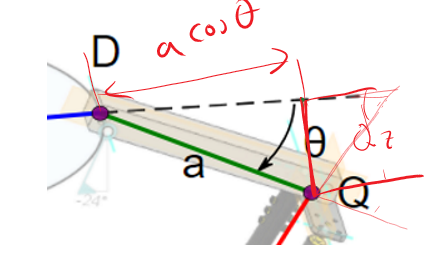

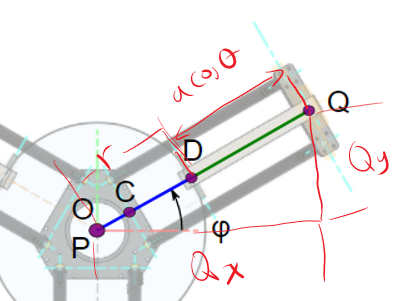

por lo tanto para cada brazo aplica que

$Q_x = (r + a\cos(\theta)) \cos(\phi)$

$Q_y = (r + a\cos(\theta)) \sin(\phi)$

$Q_z = a\sin(\theta))$

Luego, se puede encontrar la ubicación del punto $P$ como la intersección de 3 esferas con centro en los respectivos puntos $Q$ de cada brazo, PERO, desplazados una cantidad correspondiente a los vectores $h$ de la base móvil. Le llamaremos a estos puntos $Qh$, donde 

$\overrightarrow{Qh} = \overrightarrow{Q} - \overrightarrow{h}$ y

$h_x = h\cos(\phi)$

$h_y = h\sin(\phi)$

$h_z = 0$

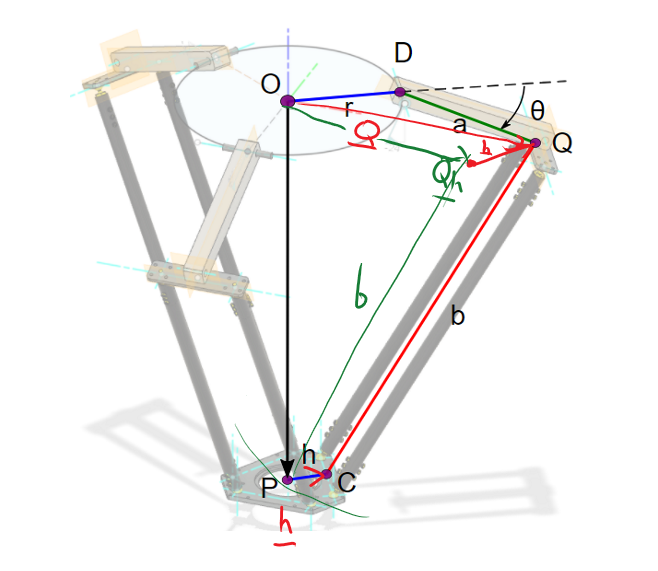

Para mayor información, puede revisar este recurso: 

https://stackoverflow.com/questions/18162880/how-to-correctly-compute-direct-kinematics-for-a-delta-robot

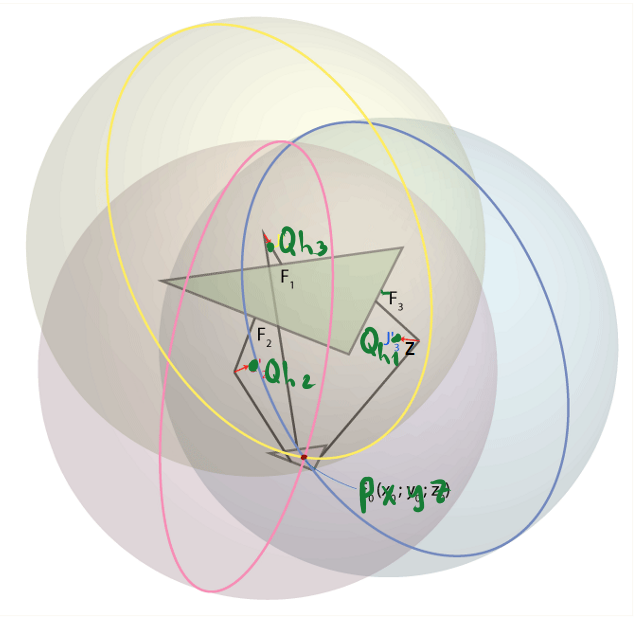

Precaución, la notación de la imagen cambia, pendiente actualizar la imagen para que coincida con la notación de este documento.

Las ecuaciones serían:

\begin{equation}
\label{eq:esfera1}
(p_x - Qh1_x)^2+(p_y - Qh1_y)^2+(p_z - Qh1_z)^2 = b^2
\end{equation}

\begin{equation}
\label{eq:esfera2}
(p_x - Qh2_x)^2+(p_y - Qh2_y)^2+(p_z - Qh2_z)^2 = b^2
\end{equation}

\begin{equation}
\label{eq:esfera3}
(p_x - Qh3_x)^2+(p_y - Qh3_y)^2+(p_z - Qh3_z)^2 = b^2
\end{equation}

# Solución por métodos numéricos

In [14]:
## magia de IPython para limpiar variables del entorno, REQUIERE IPython
%reset -sf
%matplotlib inline

## Importar módulos

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import fsolve
#para realizar animaciones
from matplotlib.animation import FuncAnimation
#para gráficas 3D
from mpl_toolkits.mplot3d import Axes3D

## Definir función

In [16]:
def fn_deltaDir(condIni,params):
    #Vars. de entrada
    th = params[0] # lista de valores th1,th2,th3
    #parametros
    a =  params[1]
    b =  params[2]
    h =  params[3]
    r =  params[4]
    phi = params[5] # lista de valores phi1,phi2,phi3
    Qx = params[6] # lista de valores Qx1,Qx2,Qx3
    Qy = params[7] # lista de valores Qy1,Qy2,Qy3
    Qz = params[8] # lista de valores Qz1,Qz2,Qz3
    
    px = condIni[0]
    py = condIni[1]
    pz = condIni[2]
    
    Y = np.zeros(3)
    for i in range(0,3):
        
        Qhx = Qx[i] - h*np.cos(phi[i])
        Qhy = Qy[i] - h*np.sin(phi[i])
        Y[i] = (px-Qhx)**2 + (py-Qhy)**2 + (pz-Qz[i])**2 - b**2
        
    return Y

## Probar función

In [17]:
# Posición HOME del robot, theta = 23.5°

thv = [np.deg2rad(-23.5),np.deg2rad(-23.5),np.deg2rad(-23.5)]

#eje motores a eje paralelogramo superior (esf?ricos)
a=200.87
#longitud paralelogramo
b=526.695
#distancia eje paralelogramo inferior (esf?ricos) a centro de la base m?vil
h= 52.528
#base fija a eje motores [mm]
r=144.34 

phi1 = np.deg2rad(30)
phi2 = phi1 + np.deg2rad(120)
phi3 = phi1 + np.deg2rad(240)

px_ini = 0
py_ini = 0
pz_ini = -528.6718

phiv = [phi1,phi2,phi3]
Qxv,Qyv,Qzv = np.zeros(3),np.zeros(3),np.zeros(3)
Dxv,Dyv,Dzv = np.zeros(3),np.zeros(3),np.zeros(3)

for i in range(0,3):
    Qxv[i] = (r + a*np.cos(thv[i]))*np.cos(phiv[i])
    Qyv[i] = (r + a*np.cos(thv[i]))*np.sin(phiv[i])
    Qzv[i] = a*np.sin(thv[i])
    Dxv[i] = r*np.cos(phiv[i])
    Dyv[i] = r*np.sin(phiv[i])
    Dzv[i] = 0

x0 = [px_ini,py_ini,pz_ini]
parametros = [thv,a,b,h,r,phiv,Qxv,Qyv,Qzv]
print(fn_deltaDir(x0,parametros))


[0.04008007 0.04008007 0.04008007]


## Resolver el sistema para las condiciones iniciales y definición de puntos C

In [18]:
# Aquí se cambiaría parametros[0] por los tres valores de theta
q,info,exitflag,mensaje = fsolve(fn_deltaDir,x0,args = parametros,full_output = True)
print("Condiciones iniciales = ",x0)
print("solucion = ",q,"\n",exitflag,"\n",mensaje)
x0 = q
px = q[0]
py = q[1]
pz = q[2]

Cxv,Cyv,Czv = np.zeros(3),np.zeros(3),np.zeros(3)
for i in range(0,3):
    Cxv[i] = px + h*np.cos(phiv[i])
    Cyv[i] = py + h*np.sin(phiv[i])
    Czv[i] = pz

Condiciones iniciales =  [0, 0, -528.6718]
solucion =  [-6.08760982e-14  3.51468191e-14 -5.28671755e+02] 
 1 
 The solution converged.


## Graficar posición inicial

Text(0.5, 0, 'eje z [mm]')

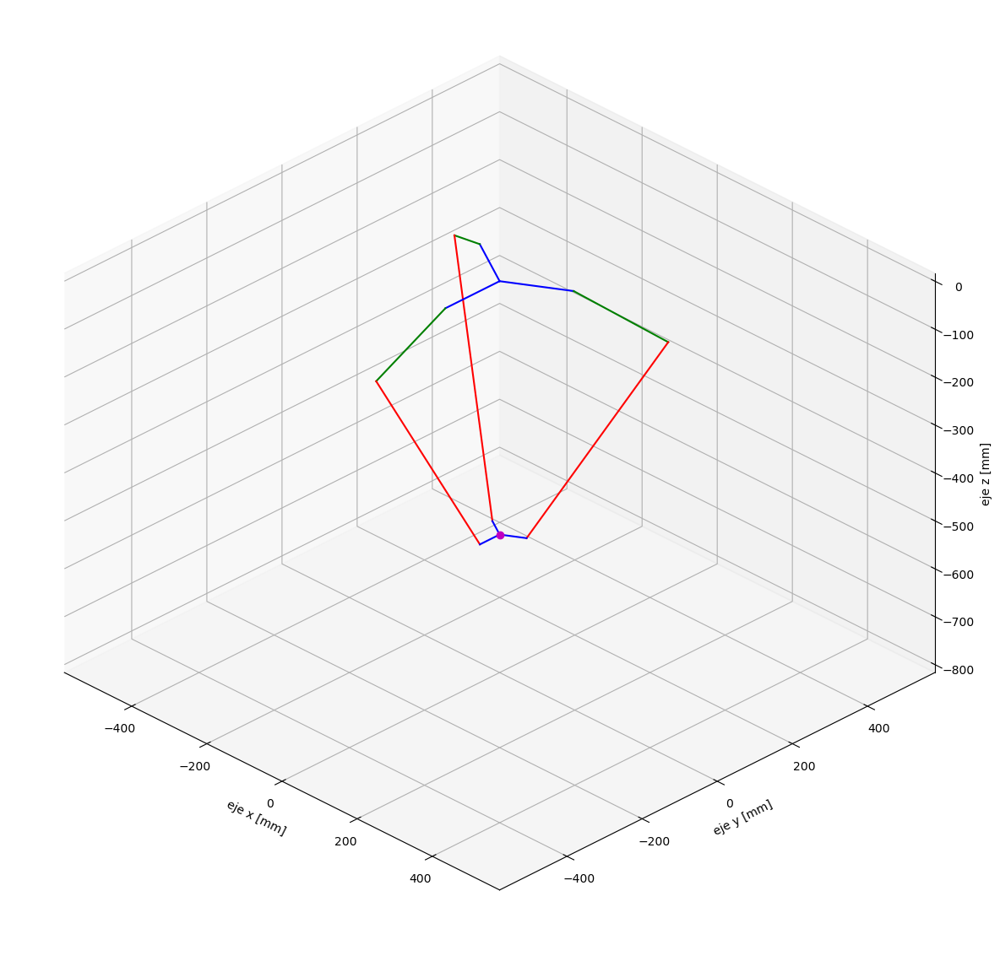

In [19]:
fig1 = plt.figure(figsize=(15, 15),
                  dpi = 100)
ax = fig1.add_subplot(111,projection = '3d', proj_type = 'ortho')
# Vistas - Descomentar una
# Vista ISO
ax.view_init(elev=30, azim=315)
# # Vista Frontal
# ax.view_init(elev=0, azim=270)
# # Vista Superior
# ax.view_init(elev=90, azim=270)

#crear listas con cualquier trio de elementos, luego se reemplazan con los plots correspondientes
h_a = [0,0,0]
h_b = [0,0,0]
h_h = [0,0,0]
for i in range(0,3):
    ax.plot([Dxv[i],0],[Dyv[i],0],[Dzv[i],0],'-b')
    h_a[i] = ax.plot([Dxv[i],Qxv[i]],[Dyv[i],Qyv[i]],[Dzv[i],Qzv[i]],'-g')
    h_b[i] = ax.plot([Cxv[i],Qxv[i]],[Cyv[i],Qyv[i]],[Czv[i],Qzv[i]],'-r')
    h_h[i] = ax.plot([Cxv[i],px],[Cyv[i],py],[Czv[i],pz],'-b')

h_P = ax.plot([px],[py],[pz],'mo',linewidth = 2)
fEscala = 1.39
ax.set_xlim3d(-400*fEscala,400*fEscala)
ax.set_ylim3d(-400*fEscala,400*fEscala)
ax.set_zlim3d(-800,0)
ax.set_xlabel("eje x [mm]")
ax.set_ylabel("eje y [mm]")
ax.set_zlabel("eje z [mm]")

## Definir conjunto de ángulos

Aquí se debe importar el archivo .csv

In [20]:
# # Prueba en caso de no tener archivo .csv, va desde -23.5 hasta -23.5 + 45 grados
# numpos = 1000

# thm = np.transpose([np.linspace(thv[0],thv[0]-np.pi/4,numpos),
#        np.linspace(thv[1],thv[1]-np.pi/4,numpos),
#        np.linspace(thv[2],thv[2]-np.pi/4,numpos)])
# thm[:][35]

thm = np.deg2rad(np.genfromtxt('angulos.csv', delimiter=','))
numpos = int(np.size(thm)/3)
thm = np.reshape(thm,[numpos,3])
numpos,thm

(435,
 array([[-0.41015237, -0.41015237, -0.41015237],
        [-0.43011894, -0.43011894, -0.43011894],
        [-0.45008551, -0.45008551, -0.45008551],
        ...,
        [-0.40844195, -0.44837508, -0.42847833],
        [-0.40917499, -0.42922882, -0.41922809],
        [-0.41015237, -0.41015237, -0.41015237]]))

## Calcular puntos Q

In [21]:
Qxm = np.zeros([numpos,3])
Qym = np.zeros([numpos,3])
Qzm = np.zeros([numpos,3])
for i in range(0,numpos):
    for j in range(0,3):
        Qxm[i][j] = (r + a*np.cos(thm[i][j]))*np.cos(phiv[j])
        Qym[i][j] = (r + a*np.cos(thm[i][j]))*np.sin(phiv[j])
        Qzm[i][j] = a*np.sin(thm[i][j])
        
Qzm

array([[-80.09672548, -80.09672548, -80.09672548],
       [-83.75855418, -83.75855418, -83.75855418],
       [-87.3869925 , -87.3869925 , -87.3869925 ],
       ...,
       [-79.78153175, -87.07750865, -83.45890898],
       [-79.91664341, -83.59600864, -81.76523945],
       [-80.09672548, -80.09672548, -80.09672548]])

## Solución para un conjunto de ángulos

cabe resaltar que la solución de este sistema puede ser algo demandante, por lo que puede arrojar advertencia de que está tomandose muchas iteraciones para converger, finalmente converge.

In [22]:
EXITFLAG = np.zeros(numpos)
# pxv = np.zeros([numpos,3])
# pym = np.zeros([numpos,3])
# pzm = np.zeros([numpos,3])
txv = np.zeros(numpos)
tyv = np.zeros(numpos)
tzv = np.zeros(numpos)

for i in range(0,numpos):
    parametros[0] = thm[:][i]
    parametros[6] = Qxm[i][:]
    parametros[7] = Qym[i][:]
    parametros[8] = Qzm[i][:]
    Y,info,EXITFLAG[i],msg = fsolve(fn_deltaDir,x0,args = parametros,full_output = True,maxfev=1000)
    x0 = Y
    txv[i] = Y[0];
    tyv[i] = Y[1];
    tzv[i] = Y[2];
#     if EXITFLAG[i] != 1:
#         print("Error en la iteración ",i,". msg = ", msg)
#         break
#     print(parametros)

EXITFLAG

array([1., 1., 1., 5., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1.

In [23]:
Cxm = np.transpose(np.array([ txv + h*np.cos(phiv[0]),txv + h*np.cos(phiv[1]),txv + h*np.cos(phiv[2])]))
Cym = np.transpose(np.array([ tyv + h*np.sin(phiv[0]),tyv + h*np.sin(phiv[1]),tyv + h*np.sin(phiv[2])]))
Czm = np.transpose(np.array([ tzv,tzv,tzv]))
Czm

array([[-528.67175533, -528.67175533, -528.67175533],
       [-528.67175533, -528.67175533, -528.67175533],
       [-528.67175533, -528.67175533, -528.67175533],
       ...,
       [-532.86594777, -532.86594777, -532.86594777],
       [-530.76832812, -530.76832812, -530.76832812],
       [-528.67175533, -528.67175533, -528.67175533]])

## Animación.

In [24]:
ax.plot(txv,tyv,tzv,'m',linewidth = 2)

def animar(i):
    for j in range(0,3):
        brazo1_X = np.array([Dxv[j],Qxm[i,j]])
        brazo1_Y = np.array([Dyv[j],Qym[i,j]])
        brazo1_Z = np.array([Dzv[j],Qzm[i,j]])
        antebrazo1_X = np.array([Cxm[i,j],Qxm[i,j]])
        antebrazo1_Y = np.array([Cym[i,j],Qym[i,j]])
        antebrazo1_Z = np.array([Czm[i,j],Qzm[i,j]])
        bmovil1_X = np.array([Cxm[i,j],txv[i]])
        bmovil1_Y = np.array([Cym[i,j],tyv[i]])
        bmovil1_Z = np.array([Czm[i,j],tzv[i]])
        h_a[j][0].set_data_3d([brazo1_X,brazo1_Y,brazo1_Z])
        h_b[j][0].set_data_3d([antebrazo1_X,antebrazo1_Y,antebrazo1_Z])
        h_h[j][0].set_data_3d([bmovil1_X,bmovil1_Y,bmovil1_Z])
    
    h_P[0].set_data_3d([txv[i],tyv[i],tzv[i]])
    
    # Agregar los objetos gráficos a esta línea de return (evita error en spyder)
    return h_P[0],h_a[0][0],h_b[0][0],h_h[0][0]

videoLength = 5000 # en milisegundos
maxFrames = 80
increment = int(np.ceil(numpos/maxFrames))
totalFrames = range(0,numpos,increment)
animacion = FuncAnimation(fig1, animar, frames = totalFrames,
                          interval=videoLength/len(totalFrames), save_count=len(totalFrames),blit=True)

#En Jupyter se pueden mostrar las animaciones directamente en el cuaderno
from IPython.display import HTML

# Comentar para reducir tamaño del cuaderno, generar animación en formato gif o mp4, requiere instalar ffmpeg
HTML(animacion.to_jshtml())
#animacion.save('animation.gif', writer='Pillow', fps=15)
#animacion.save('animation.mp4', writer='ffmpeg', fps=15)

## Verificación de límites

Se debe verificar que los ángulos $\theta_1,\theta_2$ y $\theta_3$ No excedan los limites [-85°,-20°]

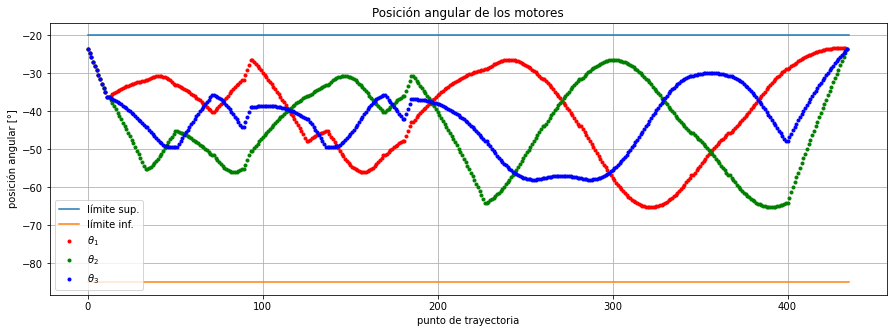

In [25]:
fig2,ax = plt.subplots(figsize=(15,5))
ax.plot([0,numpos],[-20,-20])
ax.plot([0,numpos],[-85,-85])
ax.set_title("Posición angular de los motores")
ax.set_xlabel("punto de trayectoria")
ax.set_ylabel("posición angular [°]")
ax.grid()
thmdeg = np.rad2deg(thm)
ax.plot(thmdeg[:,0],'.r')
ax.plot(thmdeg[:,1],'.g')
ax.plot(thmdeg[:,2],'.b')
ax.legend(["límite sup.","límite inf.","$\\theta_1$","$\\theta_2$","$\\theta_3$"])


## Comparación de trayectorias

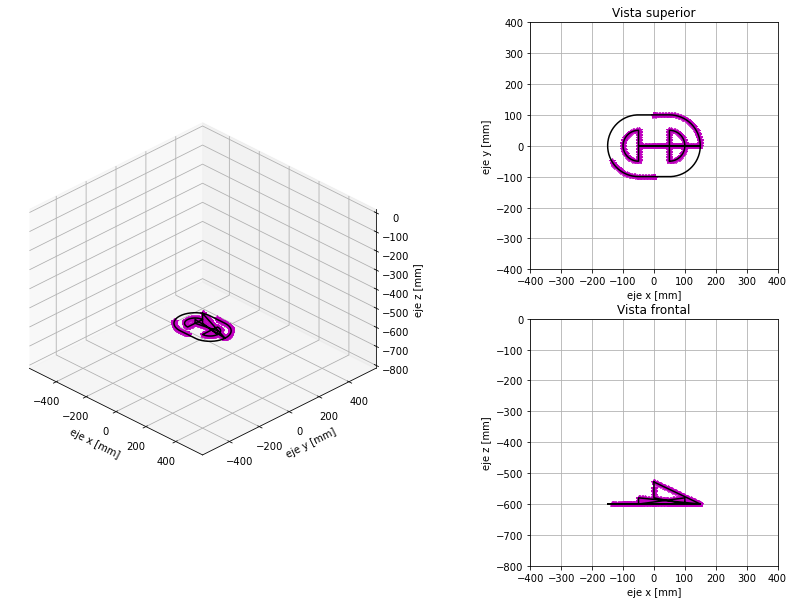

In [26]:
import pickle
with open("trayectoria", "rb") as f:
    [[txvInv],[tyvInv],[tzvInv]] = pickle.load(f)

numpos = np.size(txv)

limX = np.array([-400,400])
limY = np.array([-400,400])
limZ = (-800,0)

fig1 = plt.figure(figsize=(15, 10))
ax1 = fig1.add_subplot(2,2,(1,3),projection = '3d', proj_type = 'ortho')
ax1.view_init(elev=30, azim=315)

fEscala = 1.39
ax1.set_xlim3d(limX*fEscala)
ax1.set_ylim3d(limY*fEscala)
ax1.set_zlim3d(-800,0)
ax1.set_xlabel("eje x [mm]")
ax1.set_ylabel("eje y [mm]")
ax1.set_zlabel("eje z [mm]")

ax2 = fig1.add_subplot(2,2,2)
ax2.set_title("Vista superior")
ax2.set_xlabel("eje x [mm]")
ax2.set_ylabel("eje y [mm]")
ax2.axis("scaled")
ax2.grid()
ax2.set_xlim(limX)
ax2.set_ylim(limY)
ax3 = fig1.add_subplot(2,2,4)
ax3.set_title("Vista frontal")
ax3.set_xlabel("eje x [mm]")
ax3.set_ylabel("eje z [mm]")
ax3.axis("scaled")
ax3.grid()
ax3.set_xlim(limX)
ax3.set_ylim(limZ)

ax1.plot(txv,tyv,tzv,'*m') #vista iso
ax2.plot(txv,tyv,'*m') #vista superior
ax3.plot(txv,tzv,'*m') #vista lateral
ax1.plot(txvInv,tyvInv,tzvInv,'k') #vista iso
ax2.plot(txvInv,tyvInv,'k') #vista superior
ax3.plot(txvInv,tzvInv,'k') #vista lateral